# Corona Virus

* Coronaviruses are **zoonotic** viruses (means transmitted between animals and people).  
* Symptoms include from fever, cough, respiratory symptoms, and breathing difficulties. 
* In severe cases, it can cause pneumonia, severe acute respiratory syndrome (SARS), kidney failure and even death.

* A **novel coronavirus (nCoV)** is a new strain that has not been previously identified in humans.

* Corona Virus Disease 2019
* Caused by a **SARS-COV-2** corona virus.  
* First identified in **Wuhan, Hubei, China**.  
* Earliest reported symptoms occurred on **1 December 2019**. 
* First cases were linked to contact with the Huanan Seafood Wholesale Market, which sold live animals. 
* On 30 January the WHO declared the outbreak to be a Public Health Emergency of International Concern 

In [1]:
# Essential Libraries
import json
import random
from urllib.request import urlopen

# Storing and Anaysis
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap
import folium
import kaggle
import os

# Color pallette
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

# Converter
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Hide warnings
import warnings
warnings.filterwarnings('ignore')

# Importing Dataset

In [2]:
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()

In [3]:
os.remove('covid_19_clean_complete.csv')
api.dataset_download_file('imdevskp/corona-virus-report', 'covid_19_clean_complete.csv')

True

In [4]:
dataset = pd.read_csv('covid_19_clean_complete.csv', parse_dates=['Date'])

# Cleaning Data

In [5]:
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']
dataset['Active'] = dataset['Confirmed'] - dataset['Recovered']- dataset['Deaths']
dataset['Country/Region'] = dataset['Country/Region'].replace('Mainland China', 'China')
dataset[['Province/State']] = dataset[['Province/State']].fillna('')
dataset[cases] = dataset[cases].fillna(0)

# Dervived Tables

In [6]:
# Cases in the Ship
ship = dataset[dataset['Province/State'].str.contains('Grand Princess')|dataset['Province/State'].str.contains('Diamond Princess cruise ship')]


# China and the rest of the world
china = dataset[dataset['Country/Region'] == 'China']
row = dataset[dataset['Country/Region'] != 'China']

# Latest
full_latest = dataset[dataset['Date'] == max(dataset['Date'])].reset_index()
china_latest = dataset[dataset['Country/Region'] == 'China']
row_latest = dataset[dataset['Country/Region'] != 'China']

# Latest Condensed
full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

# Latest Data

## Latest Complete Data

In [7]:
temp = dataset.groupby(['Country/Region', 'Province/State'])['Confirmed', 'Deaths', 'Recovered', 'Active'].max()
temp.style.background_gradient(cmap='Reds')

,,Confirmed,Deaths,Recovered,Active
Country/Region,Province/State,,,,
Afghanistan,,7,0,0,7
Albania,,33,1,0,32
Algeria,,26,2,8,20
Andorra,,1,0,1,1
Antigua and Barbuda,,1,0,0,1
Argentina,,31,2,0,29
Armenia,,8,0,0,8
Aruba,,2,0,0,2
Australia,Australian Capital Territory,1,0,0,1


## Latest Condensed Data

In [8]:
temp = dataset.groupby('Date')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
temp = temp[temp['Date']==max(temp['Date'])].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1')

,Date,Confirmed,Deaths,Recovered,Active
0,2020-03-13 00:00:00,145193,5404,70251,69538


In [9]:
tm = temp.melt(id_vars = 'Date', value_vars = ['Active', 'Deaths', 'Recovered'])
fig = px.treemap(tm, path = ['variable'], values = 'value', height = 400, width = 600, color_discrete_sequence = [rec, act, dth])
fig.show()

# Country-Wise Data

## Each Country

In [10]:
temp_f = full_latest_grouped.sort_values(by='Confirmed', ascending = False)
temp_f = temp_f.reset_index(drop = True)
temp_f.style.background_gradient(cmap = 'Reds')

,Country/Region,Confirmed,Deaths,Recovered,Active
0,China,80945,3180,64196,13569
1,Italy,17660,1266,1439,14955
2,Iran,11364,514,2959,7891
3,"Korea, South",7979,66,510,7403
4,Spain,5232,133,193,4906
5,Germany,3675,7,46,3622
6,France,3667,79,12,3576
7,US,2179,47,12,2120
8,Switzerland,1139,11,4,1124
9,Norway,996,0,1,995


## Country-Wise Deaths Reported

In [11]:
temp_flg = temp_f[temp_f['Deaths'] > 0][['Country/Region', 'Deaths']]
temp_flg.sort_values('Deaths', ascending = False).reset_index(drop = True).style.background_gradient(cmap = 'Reds')

,Country/Region,Deaths
0,China,3180
1,Italy,1266
2,Iran,514
3,Spain,133
4,France,79
5,"Korea, South",66
6,US,47
7,Japan,19
8,Switzerland,11
9,Netherlands,10


## Country with no cases recovered

In [12]:
temp = temp_f[temp_f['Recovered'] == 0][['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp.reset_index(drop = True).style.background_gradient(cmap = 'Reds')

,Country/Region,Confirmed,Deaths,Recovered
0,Netherlands,804,10,0
1,Qatar,320,0,0
2,Greece,190,1,0
3,Brazil,151,0,0
4,Slovenia,141,0,0
5,Czechia,141,0,0
6,Ireland,90,1,0
7,San Marino,80,5,0
8,Estonia,79,0,0
9,Poland,68,2,0


## Countries with all dead

In [13]:
temp = row_latest_grouped[row_latest_grouped['Confirmed']==
                          row_latest_grouped['Deaths']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths
0,Guyana,2,2
1,Sudan,1,1


## Countries with all recovered

In [14]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == 
                          row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Recovered']]
temp.sort_values('Confirmed', ascending = False).reset_index(drop = True).style.background_gradient(cmap = 'Greens')

,Country/Region,Confirmed,Recovered


## Countries with no affected cases

In [15]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == 
                          row_latest_grouped['Deaths'] + row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp.sort_values('Confirmed', ascending = False).reset_index(drop = True).style.background_gradient(cmap = 'Greens')

,Country/Region,Confirmed,Deaths,Recovered
0,Guyana,2,2,0
1,Sudan,1,1,0


# Chinese Province-Wise Data

## Each Province

In [16]:
temp_f = china_latest_grouped[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f.sort_values('Confirmed', ascending = False).reset_index(drop = True).style.background_gradient(cmap = 'Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Hubei,2216904,83706,809753
1,Guangdong,53211,185,28163
2,Henan,49080,636,29745
3,Zhejiang,48876,23,28018
4,Hunan,40076,118,24434
5,Anhui,37747,191,21849
6,Jiangxi,35829,33,20677
7,Shandong,25981,151,13117
8,Jiangsu,23958,0,14340
9,Chongqing,22897,197,12268


## Province with no cases recovered

In [17]:
temp = china_latest_grouped[china_latest_grouped['Confirmed']==
                          china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed','Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered


## Province with all cases dead

In [18]:
temp_f = china_latest_grouped[china_latest_grouped['Confirmed'] ==
                              china_latest_grouped['Deaths']]
temp_f = temp_f[['Province/State', 'Confirmed', 'Deaths']]
temp_f.sort_values('Confirmed', ascending = False).reset_index(drop = True).style.background_gradient(cmap = 'Greens')

,Province/State,Confirmed,Deaths


## Province with all cases recovered

In [19]:
temp_f = china_latest_grouped[china_latest_grouped['Confirmed'] ==
                              china_latest_grouped['Recovered']]
temp_f = temp_f[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f.sort_values('Confirmed', ascending = True).reset_index(drop = True).style.background_gradient(cmap = 'Greens')

,Province/State,Confirmed,Deaths,Recovered


## Province with no affected cases

In [20]:
temp_f = china_latest_grouped[china_latest_grouped['Confirmed'] ==
                              china_latest_grouped['Deaths'] + china_latest_grouped['Recovered']]
temp_f = temp_f[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f.sort_values('Confirmed', ascending = True).reset_index(drop = True).style.background_gradient(cmap = 'Greens')

,Province/State,Confirmed,Deaths,Recovered


# Maps

## Across the world

In [21]:
m = folium.Map(location = [0, 0], tiles = 'cartodbpositron', min_zoom = 1, max_zoom = 4, zoom_start = 1)

for i in range(0, len(full_latest)):
    folium.Circle(location=[full_latest.iloc[i]['Lat'], full_latest.iloc[i]['Long']],
                 color = 'crimson', 
                 tooltip  = '<li><bold>Country   : ' + str(full_latest.iloc[i]['Country/Region']) +
                            '<li><bold>Province  : ' + str(full_latest.iloc[i]['Province/State']) +
                            '<li><bold>Confirmed : ' + str(full_latest.iloc[i]['Confirmed']) +
                            '<li><bold>Deaths    : ' + str(full_latest.iloc[i]['Deaths']) +
                            '<li><bold>Recovered : ' + str(full_latest.iloc[i]['Recovered']),
                 radius=int(full_latest.iloc[i]['Confirmed'])**1.1).add_to(m)
m

In [22]:
fig = px.choropleth(full_latest_grouped, locations="Country/Region",
                    locationmode='country names',
                    color = "Confirmed",
                    hover_name="Country/Region",
                    range_color=[1,7000],
                    color_continuous_scale="aggrnyl",
                    title = 'Countries with Confirmed Cases')

fig.update(layout_coloraxis_showscale = False)
fig.show()

In [23]:
fig = px.choropleth(full_latest_grouped[full_latest_grouped['Deaths']>0], 
                    locations="Country/Region",
                    locationmode='country names',
                    color = "Deaths",
                    hover_name="Country/Region",
                    range_color=[1,50],
                    color_continuous_scale="agsunset",
                    title = 'Countries with Deaths Reported')

fig.update(layout_coloraxis_showscale = False)
fig.show()

In [24]:
formated_gdf = dataset.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3)

fig = px.scatter_geo(formated_gdf, 
                    locations="Country/Region",
                    locationmode='country names',
                    color = "Confirmed",
                    size='size',
                    hover_name="Country/Region",
                    range_color=[0, max(formated_gdf['Confirmed'])+2],
                    projection="natural earth",
                    animation_frame="Date",
                    title = 'Spread Over Time')

fig.update(layout_coloraxis_showscale = False)
fig.show()

# Ships

In [25]:
ship.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
105,Grand Princess,US,37.6489,-122.6655,2020-01-22,0,0,0,0
226,Grand Princess,Canada,37.6489,-122.6655,2020-01-22,0,0,0,0
335,Grand Princess,US,37.6489,-122.6655,2020-01-23,0,0,0,0
456,Grand Princess,Canada,37.6489,-122.6655,2020-01-23,0,0,0,0
565,Grand Princess,US,37.6489,-122.6655,2020-01-24,0,0,0,0


In [26]:
temp = ship[ship['Date']==max(ship['Date'])]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp.reset_index(drop = True).style.background_gradient(cmap = 'Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Grand Princess,21,0,0
1,Grand Princess,2,0,0


In [27]:
temp = ship[ship['Date']==max(ship['Date'])]

m = folium.Map(location = [0, 0], tiles = 'cartodbpositron', min_zoom = 1, max_zoom = 4, zoom_start = 1)

for i in range(0, len(temp)):
    folium.Circle(location=[temp.iloc[i]['Lat'], temp.iloc[i]['Long']],
                 color = 'crimson', 
                 tooltip  = '<li><bold>Country   : ' + str(full_latest.iloc[i]['Country/Region']) +
                            '<li><bold>Province  : ' + str(full_latest.iloc[i]['Province/State']) +
                            '<li><bold>Confirmed : ' + str(full_latest.iloc[i]['Confirmed']) +
                            '<li><bold>Deaths    : ' + str(full_latest.iloc[i]['Deaths']) +
                            '<li><bold>Recovered : ' + str(full_latest.iloc[i]['Recovered']),
                 radius=100000).add_to(m)
m

In [28]:
temp = dataset.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="Date", y="Count", color='Case',
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.show()

# Recovery and Mortality Rate over time

In [29]:
temp = dataset.groupby('Date').sum().reset_index()


temp['No. of Deaths to 100 Confirmed Cases'] = round(temp['Deaths']/temp['Confirmed'], 3)*100
temp['No. of Recovered to 100 Confirmed Cases'] = round(temp['Recovered']/temp['Confirmed'], 3)*100


temp = temp.melt(id_vars='Date', 
                 value_vars=['No. of Deaths to 100 Confirmed Cases', 'No. of Recovered to 100 Confirmed Cases'], 
                 var_name='Ratio', 
                 value_name='Value')

fig = px.line(temp, 
              x="Date", 
              y="Value", 
              color='Ratio', 
              log_y=True, 
              title='Recovery and Mortality Rate Over The Time', 
              color_discrete_sequence=[dth, rec])

fig.show()

# No. of places to which COVID-19 spread

In [30]:
c_spread = china[china['Confirmed']!=0].groupby('Date')['Province/State'].unique().apply(len)
c_spread = pd.DataFrame(c_spread).reset_index()

fig = px.line(c_spread, x='Date', y='Province/State', text='Province/State',
              title='Number of Provinces/States/Regions of China to which COVID-19 spread over the time',
             color_discrete_sequence=[cnf,dth, rec])
fig.update_traces(textposition='top center')
fig.show()

# ------------------------------------------------------------------------------------------

spread = dataset[dataset['Confirmed']!=0].groupby('Date')['Country/Region'].unique().apply(len)
spread = pd.DataFrame(spread).reset_index()

fig = px.line(spread, x='Date', y='Country/Region', text='Country/Region',
              title='Number of Countries/Regions to which COVID-19 spread over the time',
             color_discrete_sequence=[cnf,dth, rec])
fig.update_traces(textposition='top center')
fig.show()

# Top 20 Countries

In [31]:
flg = full_latest_grouped
flg.head()

,Country/Region,Confirmed,Deaths,Recovered,Active
0,Afghanistan,7,0,0,7
1,Albania,33,1,0,32
2,Algeria,26,2,8,16
3,Andorra,1,0,0,1
4,Antigua and Barbuda,1,0,0,1


In [32]:
fig = px.bar(flg.sort_values('Confirmed', ascending=False).head(20).sort_values('Confirmed', ascending=True), 
             x="Confirmed", y="Country/Region", title='Confirmed Cases', text='Confirmed', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Confirmed'])+10000])
fig.update_traces(marker_color=cnf, opacity=0.6, textposition='outside')
fig.show()

In [33]:
fig = px.bar(flg.sort_values('Deaths', ascending=False).head(20).sort_values('Deaths', ascending=True), 
             x="Deaths", y="Country/Region", title='Deaths', text='Deaths', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Deaths'])+500])
fig.update_traces(marker_color=dth, opacity=0.6, textposition='outside')
fig.show()

In [34]:
fig = px.bar(flg.sort_values('Recovered', ascending=False).head(20).sort_values('Recovered', ascending=True), 
             x="Recovered", y="Country/Region", title='Recovered', text='Recovered', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Recovered'])+10000])
fig.update_traces(marker_color=rec, opacity=0.6, textposition='outside')
fig.show()

In [35]:
fig = px.bar(flg.sort_values('Active', ascending=False).head(20).sort_values('Active', ascending=True), 
             x="Active", y="Country/Region", title='Active', text='Active', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Active'])+3000])
fig.update_traces(marker_color=act, opacity=0.6, textposition='outside')
fig.show()

In [36]:
# (Only countries with more than 100 case are considered)

flg['Mortality Rate'] = round((flg['Deaths']/flg['Confirmed'])*100, 2)
temp = flg[flg['Confirmed']>100]
temp = temp.sort_values('Mortality Rate', ascending=False)

fig = px.bar(temp.sort_values('Mortality Rate', ascending=False).head(15).sort_values('Mortality Rate', ascending=True), 
             x="Mortality Rate", y="Country/Region", text='Mortality Rate', orientation='h', 
             width=700, height=600, range_x = [0, 8], title='No. of Deaths Per 100 Confirmed Case')
fig.update_traces(marker_color=act, opacity=0.6, textposition='outside')
fig.show()

In [37]:
# load population dataset
pop_clean_data = pd.read_csv("population_clean.csv")

# select only the latest data
pop = pop_clean_data.loc[:, ['Country Name', '2018']]

# substitute for missing values
cols = ['French Guiana', 'Martinique', 'Palestine' , 'Republic of Ireland', 'Saint Barthelemy', 'Taiwan', 'Vatican City']
pops = [290691, 376480, 4750000, 4920455, 7122, 23476640, 1000]
for c, p in zip(cols, pops):
    temp.loc[temp['Country/Region']== c, 'Population'] = p

# replace country names 
name = {
    'Egypt, Arab Rep.': 'Egypt',
    'Hong Kong SAR, China': 'Hong Kong',
    'Iran, Islamic Rep.': 'Iran (Islamic Republic of)',
    'Macao SAR, China': 'Macau',
    'Hong Kong SAR': 'Hong Kong',
    'Russian Federation': 'Russia',
    'Slovak Republic': 'Slovakia',
    'Korea, Rep.': 'Republic of Korea',
    'United Kingdom': 'UK',
    'United States': 'US' }
pop.loc[:, 'Country Name'] = pop.loc[: 'Country Name'].replace(name)

# merge dataframes
temp = pd.merge(full_latest_grouped, pop, how='left', right_on='Country Name', left_on='Country/Region')
# print(temp[temp['Country Name'].isna()])

temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active', '2018']]
temp.columns = ['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'Population']
    
# calculate Confirmed/Population
temp['Confirmed Per Million People'] = round(temp['Confirmed']/temp['Population']*1000000, 2)

# countries with population greater that 1 million only
temp = temp[temp['Population']>1000000].sort_values('Confirmed Per Million People', ascending=False).reset_index(drop=True)
# temp.head()

fig = px.bar(temp.head(20).sort_values('Confirmed Per Million People', ascending=True), 
             x='Confirmed Per Million People', y='Country/Region', orientation='h', 
             width=700, height=700, text='Confirmed Per Million People', title='Confirmed cases Per Million People',
             range_x = [0, max(temp['Confirmed Per Million People'])+20])
fig.update_traces(textposition='outside', marker_color=dth, opacity=0.7)
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

In [38]:
temp = dataset.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()

fig = px.bar(temp, x="Date", y="Confirmed", color='Country/Region', orientation='v', height=600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

In [39]:
fig = px.bar(temp, x="Date", y="Deaths", color='Country/Region', orientation='v', height=600,
             title='Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

In [40]:
temp = dataset.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x="Date", y="Confirmed", color='Country/Region',title='New cases')
fig.show()

In [41]:
px.line(temp, x="Date", y="Confirmed", color='Country/Region', title='Cases Spread', height=600)

In [42]:
fig = px.treemap(full_latest.sort_values(by='Confirmed', ascending=False).reset_index(drop=True), 
                 path=["Country/Region", "Province/State"], values="Confirmed", height=700,
                 title='Number of Confirmed Cases',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

fig = px.treemap(full_latest.sort_values(by='Deaths', ascending=False).reset_index(drop=True), 
                 path=["Country/Region", "Province/State"], values="Deaths", height=700,
                 title='Number of Deaths reported',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

# Epidemic Span

In [43]:
# first date
# ----------
first_date = dataset[dataset['Confirmed']>0]
first_date = first_date.groupby('Country/Region')['Date'].agg(['min']).reset_index()
# first_date.head()
from datetime import timedelta  
# last date
# ---------
last_date = dataset.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
last_date = last_date.sum().diff().reset_index()

mask = last_date['Country/Region'] != last_date['Country/Region'].shift(1)
last_date.loc[mask, 'Confirmed'] = np.nan
last_date.loc[mask, 'Deaths'] = np.nan
last_date.loc[mask, 'Recovered'] = np.nan

last_date = last_date[last_date['Confirmed']>0]
last_date = last_date.groupby('Country/Region')['Date'].agg(['max']).reset_index()
# last_date.head()

# first_last
# ----------
first_last = pd.concat([first_date, last_date[['max']]], axis=1)

# added 1 more day, which will show the next day as the day on which last case appeared
first_last['max'] = first_last['max'] + timedelta(days=1)

# no. of days
first_last['Days'] = first_last['max'] - first_last['min']

# task column as country
first_last['Task'] = first_last['Country/Region']

# rename columns
first_last.columns = ['Country/Region', 'Start', 'Finish', 'Days', 'Task']

# sort by no. of days
first_last = first_last.sort_values('Days')
# first_last.head()

# visualization
# --------------

# produce random colors
clr = ["#"+''.join([random.choice('0123456789ABC') for j in range(6)]) for i in range(len(first_last))]

#plot
fig = ff.create_gantt(first_last, index_col='Country/Region', colors=clr, show_colorbar=False, 
                      bar_width=0.2, showgrid_x=True, showgrid_y=True, height=1600, 
                      title=('Gantt Chart'))
fig.show()

# China vs ROW

In [44]:
# In China
temp = china.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars="Date", 
                 value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x="Date", y="value", color='variable', 
             title='In China',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.show()

#-----------------------------------------------------------------------------

# ROW
temp = row.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars="Date", 
                 value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x="Date", y="value", color='variable', 
             title='Outside China',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.show()

In [45]:
def from_china_or_not(row):
    if row['Country/Region']=='China':
        return 'From China'
    else:
        return 'Outside China'
    
temp = dataset.copy()
temp['Region'] = temp.apply(from_china_or_not, axis=1)
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Region'] != temp['Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x='Date', y='Confirmed', color='Region', barmode='group', 
             text='Confirmed', title='Confirmed', color_discrete_sequence= [cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.show()

fig = px.bar(temp, x='Date', y='Deaths', color='Region', barmode='group', 
             text='Confirmed', title='Deaths', color_discrete_sequence= [cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.update_traces(textangle=-90)
fig.show()

In [46]:
gdf = dataset.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
gdf = gdf.reset_index()

temp = gdf[gdf['Country/Region']=='China'].reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="Date", y="Count", color='Case', facet_col="Case",
            title='China', color_discrete_sequence=[cnf, dth, rec])
fig.show()

temp = gdf[gdf['Country/Region']!='China'].groupby('Date').sum().reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="Date", y="Count", color='Case', facet_col="Case",
             title='ROW', color_discrete_sequence=[cnf, dth, rec])
fig.show()

# Hubei - China - World

In [47]:
def location(row):
    if row['Country/Region']=='China':
        if row['Province/State']=='Hubei':
            return 'Hubei'
        else:
            return 'Other Chinese Provinces'
    else:
        return 'Rest of the World'

temp = dataset.copy()
temp['Region'] = temp.apply(location, axis=1)
temp['Date'] = temp['Date'].dt.strftime('%Y-%m-%d')
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars=['Region', 'Date'], value_vars=['Confirmed', 'Deaths', 'Recovered'], 
                 var_name='Case', value_name='Count').sort_values('Count')
temp.head()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
             text='Count', title='Hubei - China - World', animation_frame='Date',
             color_discrete_sequence= [dth, rec, cnf], range_x=[0, 70000])
fig.update_traces(textposition='outside')

fig.show()

temp = full_latest.copy()
temp['Region'] = temp.apply(location, axis=1)
temp = temp.groupby('Region')['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars='Region', value_vars=['Confirmed', 'Deaths', 'Recovered'], 
                 var_name='Case', value_name='Count').sort_values('Count')
temp.head()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
             text='Count', title='Hubei - China - World', 
             color_discrete_sequence= [dth, rec, cnf])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

# Proportion of Cases

In [48]:
rl = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered'].sum()
rl = rl.reset_index().sort_values(by='Confirmed', ascending=False).reset_index(drop=True)
rl.head().style.background_gradient(cmap='rainbow')

ncl = rl.copy()
ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars="Country/Region", value_vars=['Affected', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), 
             x="Country/Region", y="value", color='variable', orientation='v', height=800,
             title='Number of Cases outside China', color_discrete_sequence=[act, dth, rec])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

# ------------------------------------------

cl = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered'].sum()
cl = cl.reset_index().sort_values(by='Confirmed', ascending=False).reset_index(drop=True)
# cl.head().style.background_gradient(cmap='rainbow')

ncl = cl.copy()
ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars="Province/State", value_vars=['Affected', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), 
             y="Province/State", x="value", color='variable', orientation='h', height=800,
             title='Number of Cases in China', color_discrete_sequence=[act, dth, rec])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

# Country Wise

## Confirmed cases

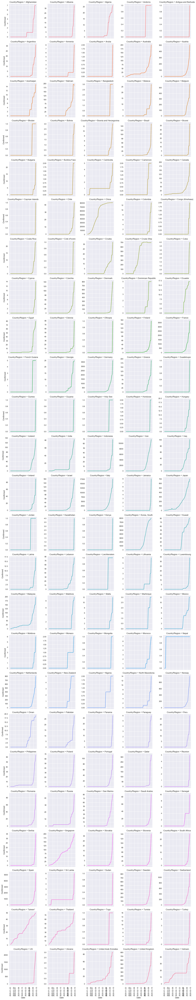

In [49]:
temp = dataset.groupby(['Date', 'Country/Region'])['Confirmed'].sum()
temp = temp.reset_index().sort_values(by=['Date', 'Country/Region'])

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col="Country/Region", hue="Country/Region", 
                  sharey=False, col_wrap=5)
g = g.map(plt.plot, "Date", "Confirmed")
g.set_xticklabels(rotation=90)
plt.show()

## New cases

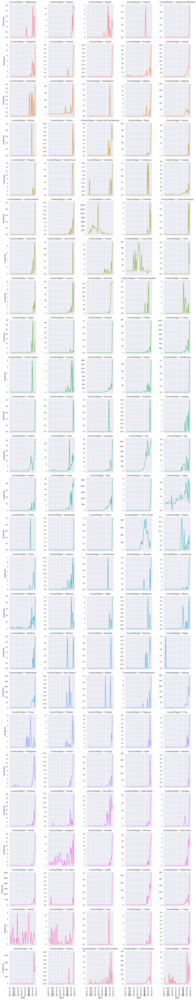

In [50]:
temp = dataset.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col="Country/Region", hue="Country/Region", 
                  sharey=False, col_wrap=5)
g = g.map(sns.lineplot, "Date", "Confirmed")
g.set_xticklabels(rotation=90)
plt.show()

# Comparison with other epidemics

In [51]:
epidemics = pd.DataFrame({
    'epidemic' : ['COVID-19', 'SARS', 'EBOLA', 'MERS', 'H1N1'],
    'start_year' : [2019, 2003, 2014, 2012, 2009],
    'end_year' : [2020, 2004, 2016, 2017, 2010],
    'confirmed' : [full_latest['Confirmed'].sum(), 8096, 28646, 2494, 6724149],
    'deaths' : [full_latest['Deaths'].sum(), 774, 11323, 858, 19654]
})

epidemics['mortality'] = round((epidemics['deaths']/epidemics['confirmed'])*100, 2)

epidemics.head()

,epidemic,start_year,end_year,confirmed,deaths,mortality
0,COVID-19,2019,2020,145193,5404,3.72
1,SARS,2003,2004,8096,774,9.56
2,EBOLA,2014,2016,28646,11323,39.53
3,MERS,2012,2017,2494,858,34.40
4,H1N1,2009,2010,6724149,19654,0.29


In [52]:
temp = epidemics.melt(id_vars='epidemic', value_vars=['confirmed', 'deaths', 'mortality'],
                      var_name='Case', value_name='Value')

fig = px.bar(temp, x="epidemic", y="Value", color='epidemic', text='Value', facet_col="Case",
             color_discrete_sequence = px.colors.qualitative.Bold)
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_yaxes(showticklabels=False)
fig.layout.yaxis2.update(matches=None)
fig.layout.yaxis3.update(matches=None)
fig.show()